# Import Libraries

In [17]:
import pandas as pd
import numpy as np

pd.options.display.max_columns=None

from IPython.display import display

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

import warnings
warnings.filterwarnings("ignore")

# Load Data

In [18]:
!gdown --id 1f_sFL37PeFSx_3GyuDkh0ApCYhF3NG1s

'gdown' is not recognized as an internal or external command,
operable program or batch file.


In [19]:
#df = pd.read_csv("/content/loan_data_2007_2014.csv")
df = pd.read_csv("data/loan_data_2007_2014.csv")
df.drop("Unnamed: 0",axis=1,inplace=True)

In [20]:
print(df.shape)
display(df.head(2))

(466285, 74)


,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_il_6m,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m
0,1077501,1296599,5000,5000,4975.0,36 months,10.65,162.87,B,B2,NaN,10+ years,RENT,24000.0,Verified,Dec-11,Fully Paid,n,https://www.lendingclub.com/browse/loanDetail....,Borrower added on 12/22/11 > I need to upgra...,credit_card,Computer,860xx,AZ,27.65,0.0,Jan-85,1.0,NaN,NaN,3.0,0.0,13648,83.7,9.0,f,0.0,0.0,5861.071414,5831.78,5000.00,861.07,0.0,0.00,0.00,Jan-15,171.62,NaN,Jan-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1077430,1314167,2500,2500,2500.0,60 months,15.27,59.83,C,C4,Ryder,< 1 year,RENT,30000.0,Source Verified,Dec-11,Charged Off,n,https://www.lendingclub.com/browse/loanDetail....,Borrower added on 12/22/11 > I plan to use t...,car,bike,309xx,GA,1.00,0.0,Apr-99,5.0,NaN,NaN,3.0,0.0,1687,9.4,4.0,f,0.0,0.0,1008.710000,1008.71,456.46,435.17,0.0,117.08,1.11,Apr-13,119.66,NaN,Sep-13,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# Prepare dependent feature

In [21]:
# o means bad/default and 1 means good/non-default
df['good_bad'] = np.where(
    df['loan_status'].isin(
        ['Charged Off','Default','Late (31-120 days)','Does not meet the credit policy. Status:Charged Off']),
        0,1)

# EDA

In [22]:
fig = px.bar(x=df['loan_status'].value_counts().index, y=df['loan_status'].value_counts().values, title="Loan Status")
fig.show()

In [23]:
# finding count of good and bad customers
good_bad_count = df['good_bad'].value_counts().reset_index()

# The columns are now ['good_bad', 'count']
fig = px.bar(good_bad_count, x="good_bad", y="count", title="Good Bad Customers")
fig.show()

In [24]:
fig = px.histogram(df, x="funded_amnt")
fig.show()

In [25]:
fig = px.histogram(df, x="int_rate")
fig.show()

In [26]:
fig = px.histogram(df, x="annual_inc",nbins=500)
fig.show()

In [27]:
fig = px.histogram(df,'recoveries',nbins=100)
fig.show()

In [28]:
def barplot_by_target(df_temp,x,hue):
  variable_good_bad = df_temp.groupby(['good_bad',x]).count()['id']
  variable_good_bad = variable_good_bad.reset_index()
  variable_good_bad.columns = ['good_bad',	x,	'count']
  title = "{} by Good_Bad Customers".format(x)
  fig = px.bar(variable_good_bad, x=x, y="count", color="good_bad", title=title)
  fig.show()

In [29]:
barplot_by_target(df,'term','good_bad')

In [30]:
barplot_by_target(df,'emp_length','good_bad')

<Axes: xlabel='home_ownership'>

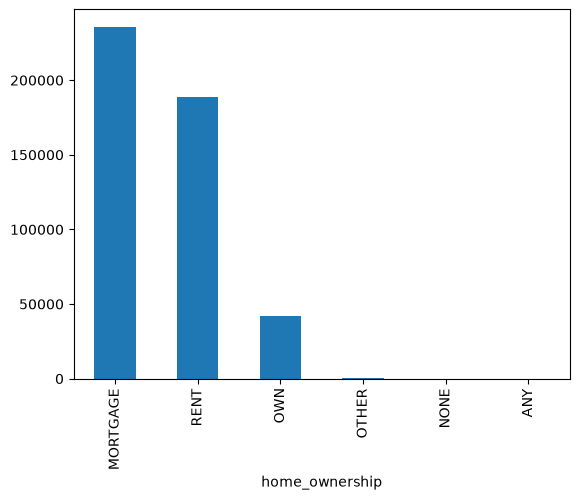

In [31]:
#home_ownership
df['home_ownership'].value_counts().plot.bar()

In [32]:
barplot_by_target(df,'home_ownership','good_bad')

In [33]:
barplot_by_target(df,'purpose','good_bad')

In [34]:
barplot_by_target(df,'application_type','good_bad')

In [35]:
df['loan_status'].value_counts().index

Index(['Current', 'Fully Paid', 'Charged Off', 'Late (31-120 days)',
       'In Grace Period', 'Does not meet the credit policy. Status:Fully Paid',
       'Late (16-30 days)', 'Default',
       'Does not meet the credit policy. Status:Charged Off'],
      dtype='object', name='loan_status')

In [36]:
barplot_by_target(df,'addr_state','good_bad')

In [37]:
barplot_by_target(df,'mths_since_last_delinq','good_bad')